In [1]:
import string
import seaborn as sns
import os
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import requests
import bs4 
import textblob
from textblob import TextBlob
from bs4 import BeautifulSoup
import warnings
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay 
warnings.filterwarnings('ignore')
%matplotlib inline




In [2]:
os.chdir('C:\\Users\\91964\\Downloads')

In [3]:
df = pd.read_excel('Tweet_NFT.xlsx')

In [4]:
df.head()

,id,tweet_text,tweet_created_at,tweet_intent
0,1212762,@crypto_brody @eCoLoGy1990 @MoonrunnersNFT @It...,2022-08-06T16:56:36.000Z,Community
1,1212763,Need Sick Character artâ_x009d_“#art #artist #...,2022-08-06T16:56:36.000Z,Giveaway
2,1212765,@The_Hulk_NFT @INagotchiNFT @Tesla @killabears...,2022-08-06T16:56:35.000Z,Appreciation
3,1212766,@CryptoBatzNFT @DarekBTW The first project in ...,2022-08-06T16:56:35.000Z,Community
4,1212767,@sashadysonn The first project in crypto with ...,2022-08-06T16:56:34.000Z,Community


In [5]:
df.columns

Index(['id', 'tweet_text', 'tweet_created_at', 'tweet_intent'], dtype='object')

In [6]:
text_df = df.drop(['tweet_created_at', 'tweet_intent'],axis = 1)

In [7]:
text_df.head()

,id,tweet_text
0,1212762,@crypto_brody @eCoLoGy1990 @MoonrunnersNFT @It...
1,1212763,Need Sick Character artâ_x009d_“#art #artist #...
2,1212765,@The_Hulk_NFT @INagotchiNFT @Tesla @killabears...
3,1212766,@CryptoBatzNFT @DarekBTW The first project in ...
4,1212767,@sashadysonn The first project in crypto with ...


In [8]:
print(text_df['tweet_text'].iloc[0],"\n")
print(text_df['tweet_text'].iloc[1],"\n")
print(text_df['tweet_text'].iloc[2],"\n")
print(text_df['tweet_text'].iloc[3],"\n")
print(text_df['tweet_text'].iloc[4],"\n")

@crypto_brody @eCoLoGy1990 @MoonrunnersNFT @ItsukiNFT @thelittlesnft @SpaceRiders_NFT @WDoopsies @WomenandWeapons @WoWPixiesNFT @BokiNFT @quirkiesnft @bitcoin_bowie @Kal_El_Krypto_ @sophiegreen86 ðŸ_x0090_¶ A new cryptocurrency was born by fans of the Chihuahua meme community. It's just simply pets love and keep 1% from each transaction which will be automatically distributed. 
â€¼ï¸_x008f_CA: 0x2fd6c9B869Dea106730269E13113361b684f843a
 @Chihuahua_bsc
TG: https://t.co/wqSzCivfaM 

Need Sick Character artâ_x009d_“#art #artist #Artists #animation #illustrators #illustrations #illustrationart #NFT #NFTGiveaways #3Danimation #3dart #conceptart #Concept #illustrators #SolanaNFTs #ArtistOnTwitter @ScrimFinder @BlazedRTs @SGH_RTs @smallstreamhype @ShoutGamers https://t.co/Nf3Egckt78 

@The_Hulk_NFT @INagotchiNFT @Tesla @killabearsnft @elonmusk Great choice on a Tesla! Good luck! 

@CryptoBatzNFT @DarekBTW The first project in crypto with move to earn  #AstroBirdz. Big things happening with th

In [9]:
text_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 127453 entries, 0 to 127452
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   id          127453 non-null  int64 
 1   tweet_text  127453 non-null  object
dtypes: int64(1), object(1)
memory usage: 1.9+ MB


In [10]:
from nltk.corpus import stopwords

In [11]:
stop_words = stopwords.words('english')

In [12]:
def data_processing(text):
    text = text.lower()
    text = re.sub(r"https\S+|www\S+https|S+", '',text, flags=re.MULTILINE)
    text = re.sub(r'\@w+|\#','',text)
    text = re.sub(r'[^\w\s]','',text)
    text_tokens = word_tokenize(text)
    filtered_text = [w for w in text_tokens if not w in stop_words]
    return " ".join(filtered_text)

In [13]:
text_df.tweet_text = text_df['tweet_text'].apply(data_processing)

In [14]:
text_df = text_df.drop_duplicates('tweet_text')

In [15]:
text_df['tweet_text'] = text_df['tweet_text'].str.replace(r"[\"\0-9\'\_\|\?\=\.\<\>\@\#\*\,]", ' ')

In [16]:
stemmer = PorterStemmer()
def stemming(data):
    text = [stemmer.stem(word) for word in data]
    return data

In [17]:
text_df['tweet_text'] = text_df['tweet_text'].apply(lambda x: stemming(x))
                                                    # to define a function in one line

In [18]:
text_df.head()

,id,tweet_text
0,1212762,crypto brody ecology moonrunnersnft itsuki...
1,1212763,need sick character artâ x d art artist arti...
2,1212765,the hulk nft inagotchinft tesla killabearsnft ...
3,1212766,cryptobatznft darekbtw first project crypto mo...
4,1212767,sashadysonn first project crypto move earn ast...


In [19]:
print(text_df['tweet_text'].iloc[0],"\n")
print(text_df['tweet_text'].iloc[1],"\n")
print(text_df['tweet_text'].iloc[2],"\n")
print(text_df['tweet_text'].iloc[3],"\n")
print(text_df['tweet_text'].iloc[4],"\n")

crypto brody ecology     moonrunnersnft itsukinft thelittlesnft spaceriders nft doopsies omenandweapons owpixiesnft bokinft quirkiesnft bitcoin bowie kal el krypto  sophiegreen   ðÿ x      new cryptocurrency born fans chihuahua meme community simply pets love keep   transaction automatically distributed â¼ï x   f ca  x fd c b   dea         e        b   f   a chihuahua bsc tg 

need sick character artâ x   d art artist artists animation illustrators illustrations illustrationart nft nftgiveaways  danimation  dart conceptart concept illustrators solananfts artistontwitter scrimfinder blazedrts sgh rts smallstreamhype shoutgamers 

the hulk nft inagotchinft tesla killabearsnft elonmusk great choice tesla good luck 

cryptobatznft darekbtw first project crypto move earn astrobirdz big things happening project release marketplace nest feedtoearn birdzarmy luna btc web  gem nft nftcommunity 

sashadysonn first project crypto move earn astrobirdz big things happening project release marketpla

In [20]:
text_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 95984 entries, 0 to 127451
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   id          95984 non-null  int64 
 1   tweet_text  95984 non-null  object
dtypes: int64(1), object(1)
memory usage: 2.2+ MB


In [21]:
def polarity(text):
    return TextBlob(text).sentiment.polarity

In [22]:
text_df['polarity'] = text_df['tweet_text'].apply(polarity)

In [23]:
text_df.head()

,id,tweet_text,polarity
0,1212762,crypto brody ecology moonrunnersnft itsuki...,0.212121
1,1212763,need sick character artâ x d art artist arti...,-0.714286
2,1212765,the hulk nft inagotchinft tesla killabearsnft ...,0.750000
3,1212766,cryptobatznft darekbtw first project crypto mo...,0.125000
4,1212767,sashadysonn first project crypto move earn ast...,0.125000


In [24]:
def sentiment(label):
    if label <0:
        return "Negative"
    elif label ==0:
        return "Neutral"
    elif label>0:
        return "Positive"

In [25]:
text_df['sentiment'] = text_df['polarity'].apply(sentiment)

In [26]:
text_df.head(15)

,id,tweet_text,polarity,sentiment
0,1212762,crypto brody ecology moonrunnersnft itsuki...,0.212121,Positive
1,1212763,need sick character artâ x d art artist arti...,-0.714286,Negative
2,1212765,the hulk nft inagotchinft tesla killabearsnft ...,0.750000,Positive
3,1212766,cryptobatznft darekbtw first project crypto mo...,0.125000,Positive
4,1212767,sashadysonn first project crypto move earn ast...,0.125000,Positive
5,1212768,ðÿž registered saphire premint nft,0.000000,Neutral
6,1212769,ðÿš bridged sold gt price sâžl ...,-0.800000,Negative
7,1212771,mtndao project best gamefi project bsc âœmu...,1.000000,Positive
8,1212772,ra bitsnft feature globalnft great community...,0.800000,Positive
9,1212774,spacebrosbsc project best gamefi project bs...,1.000000,Positive


<AxesSubplot:xlabel='sentiment', ylabel='count'>

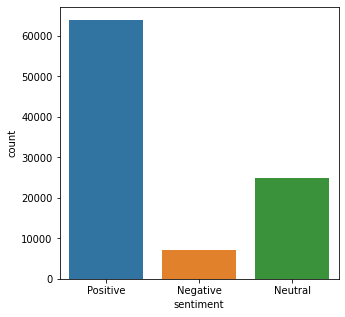

In [27]:
fig = plt.figure(figsize=(5,5))
sns.countplot(x='sentiment', data = text_df)

In [28]:
pos_tweets = text_df[text_df.sentiment == 'Positive']
pos_tweets = pos_tweets.sort_values(['polarity'], ascending = False)
pos_tweets.head(15)

,id,tweet_text,polarity,sentiment
112053,1248844,henranboolive check profile best nft collectio...,1.0,Positive
7310,1225852,tonevays finsummit project best gamefi proj...,1.0,Positive
2792,1217661,eternityrpg project best gamefi project bsc...,1.0,Positive
7269,1225780,joesirc clockdrift project best gamefi pro...,1.0,Positive
2797,1217671,crossmint io project best gamefi project bs...,1.0,Positive
97942,1216292,nftpromote jpeveze awesome ðÿ x d ðÿ x d...,1.0,Positive
118046,1260305,bearx nft spaceidprotocol wonderful project x...,1.0,Positive
97941,1216260,best âœ richquack crypto nft nfts,1.0,Positive
2802,1217681,tensor hq project best gamefi project bsc â...,1.0,Positive
85835,1400817,cryptoworld ðÿœÿ project best gamefi pro...,1.0,Positive


In [29]:
tweet1_text = ' '.join([word for word in pos_tweets['tweet_text']])
tweet1_text

'henranboolive check profile best nft collection support us develop tonevays finsummit project    best gamefi project bsc âœmultistage deflation tool pro   âœmultifeature nft âœapp appstore google play âœpresale august p   going moon whitelist tg project   p   gamefi eternityrpg project    best gamefi project bsc âœmultistage deflation tool pro   âœmultifeature nft âœapp appstore google play âœpresale august âœp   going moon whitelist tg project   p   gamefi joesirc clockdrift  project    best gamefi project bsc âœmultistage deflation tool pro   âœmultifeature nft âœapp appstore google play âœpresale august p   going moon whitelist tg project   p   gamefi crossmint io project    best gamefi project bsc âœmultistage deflation tool pro   âœmultifeature nft âœapp appstore google play âœpresale august p   going moon whitelist tg project   p   gamefi nftpromote  jpeveze awesome ðÿ x   d  ðÿ x   d   x c   c  ee   bc         a     e ba       bloonz nft steven promo emilyno   bearx nft spaceid

In [30]:
neg_tweets = text_df[text_df.sentiment == 'Negative']
neg_tweets = neg_tweets.sort_values(['polarity'], ascending = False)
neg_tweets.head(15)

,id,tweet_text,polarity,sentiment
97448,1215161,kryptochris solokaybear magiceden team hasnât...,-6.938894e-18,Negative
50637,1314916,leveling cc game totally worth read youâre cc...,-6.938894e-18,Negative
52196,1318701,bybit nft yeehagames realmidgardsaga want know...,-9.251859e-18,Negative
23010,1254664,lucasfreed supremekongnft sirvmtech throwedgen...,-5.551115e-17,Negative
84882,1398907,new nft game alert check polygon blockchain pl...,-2.727273e-03,Negative
76673,1381565,new nft game alert check polygon blockchain pl...,-2.727273e-03,Negative
115328,1255008,digital art nft polygon vacuum collapse ope...,-2.777778e-03,Negative
9735,1230128,bitcoin curious nekoztek avalancheavax celebra...,-3.409091e-03,Negative
23724,1256061,cryptochoic gemsfinderr bullish relaunch shib...,-3.409091e-03,Negative
23933,1256462,belinda life richard bscgemalerts bul...,-3.409091e-03,Negative


In [31]:
tweet2_text = ' '.join([word for word in neg_tweets['tweet_text']])
tweet2_text

'kryptochris  solokaybear magiceden team hasnât put foot wrong development processes far thatâs rare canât imagine buying nft itâs early leveling cc  game totally worth read youâre cc  curious ðÿ x      cc  thanks share boredjob bybit nft yeehagames realmidgardsaga want know game available mobile app kind options yeehagames provide game system players something like clan guild make players find another player hold tokennft play game thanks askyeeha lucasfreed supremekongnft sirvmtech throwedgenji jsupreme nft nhhooligan romejay    crypto casually nessytherilla heychristiano bradmusicnfts expertadvicewtf cannonjones    supremekongcutz bibbybambino janserce  cyoungraps criscraymusic reubenmetcalfe sure itâs discord ðÿšðÿ x   f ½ new nft game alert check polygon blockchain play earn game called muzzle run sign    august get first hound free start gt nft muzzlerun polygon nftgiveaway new nft game alert check polygon blockchain play earn game called muzzle run sign   th august get first hou

In [32]:
neu_tweets = text_df[text_df.sentiment == 'Neutral']
neu_tweets = neu_tweets.sort_values(['polarity'], ascending = False)
neu_tweets.head(15)

,id,tweet_text,polarity,sentiment
5,1212768,ðÿž registered saphire premint nft,0.0,Neutral
103846,1229884,blockchain adoption rise individuals andorgani...,0.0,Neutral
103899,1230012,taxpayingbatman dantheman spaceriders nft...,0.0,Neutral
103898,1230003,nft gurls onlyfanspromo follow back ðÿ,0.0,Neutral
103897,1230001,lilvandrop icedknife suteki nft tell em homie ...,0.0,Neutral
103893,1229990,nft gurls onlyfanspromo dm promo â x d ï x ...,0.0,Neutral
103892,1229988,rank uncommon derp bird sold â³ cardan...,0.0,Neutral
103890,1229986,solana nft crocolabs scamer,0.0,Neutral
103887,1229976,khabarnwi lifesajoke nft obviously,0.0,Neutral
103882,1229966,taxpayingbatman spaceriders nft ðÿšjoin someth...,0.0,Neutral


In [33]:
tweet3_text = ' '.join([word for word in neu_tweets['tweet_text']])
tweet3_text

'ðÿž registered saphire premint nft blockchain adoption rise individuals andorganizations looking integrate blockchain cryptonews cryptocurrency crypto nft bitcoin cryptotrading blockchain ethereum btc cryptocurrencies bitcoinnews bitcoins cryptoworld taxpayingbatman dantheman      spaceriders nft know know ðÿˆ nft gurls onlyfanspromo  follow back ðÿ lilvandrop icedknife suteki nft tell em homie pulling lilvandrop nft gurls onlyfanspromo  dm promo â x   d ï x   f  rank      uncommon derp bird sold    â³ cardano nft ada derpbirds derp solana  nft crocolabs scamer khabarnwi lifesajoke nft obviously taxpayingbatman spaceriders nft ðÿšjoin somethingðÿš       nfts opensea ðÿwhen freemintï¼ÿnow ðÿfree mint   nfts per wallet ðÿœ x   d  freemint opening  ï x   f âƒ join server  ï x   f âƒ follow twitter lifesajoke nft recurforever nickelodeon nft carebears nfts  nftu yes lets go holder since beginning ever nft actually    x value ebaversed omg got raffled blezinho tabbu    berfu yildiz pipo   

In [34]:
text_df.head(15)

,id,tweet_text,polarity,sentiment
0,1212762,crypto brody ecology moonrunnersnft itsuki...,0.212121,Positive
1,1212763,need sick character artâ x d art artist arti...,-0.714286,Negative
2,1212765,the hulk nft inagotchinft tesla killabearsnft ...,0.750000,Positive
3,1212766,cryptobatznft darekbtw first project crypto mo...,0.125000,Positive
4,1212767,sashadysonn first project crypto move earn ast...,0.125000,Positive
5,1212768,ðÿž registered saphire premint nft,0.000000,Neutral
6,1212769,ðÿš bridged sold gt price sâžl ...,-0.800000,Negative
7,1212771,mtndao project best gamefi project bsc âœmu...,1.000000,Positive
8,1212772,ra bitsnft feature globalnft great community...,0.800000,Positive
9,1212774,spacebrosbsc project best gamefi project bs...,1.000000,Positive


Text(0.5, 1.0, 'Distribution of Sentiments')

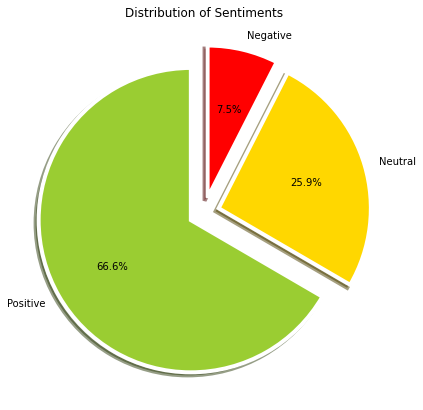

In [35]:
fig = plt.figure(figsize=(7,7))
colors = ("yellowgreen","gold","red")
wp = {'linewidth':4, 'edgecolor':"white"}
tags = text_df['sentiment'].value_counts()
explode = (0.1,0.1,0.1)
tags.plot(kind='pie', autopct='%1.1f%%', shadow=True, colors = colors, 
         startangle = 90, wedgeprops = wp, explode = explode, label='')
plt.title('Distribution of Sentiments')

In [36]:
vect = CountVectorizer(ngram_range=(1,2)).fit(text_df['tweet_text'])
       # it will give some features words to train our model

In [37]:
feature_names = vect.get_feature_names()
print("features names:\n {}".format(feature_names[100:150]))

features names:
 ['aaa cf', 'aaa dadcdfc', 'aaa dcc', 'aaa fced', 'aaa fceeade', 'aaa fda', 'aaa game', 'aaa im', 'aaa jsmiles', 'aaa kind', 'aaa maverick', 'aaa metahuahua', 'aaa nft', 'aaa powderrful', 'aaa truly', 'aaa validator', 'aaaa', 'aaaa feature', 'aaaa mily', 'aaaaa', 'aaaaa ea', 'aaaaa thank', 'aaaaaaa', 'aaaaaaa ðÿ', 'aaaaaaaaaaa', 'aaaaaaartz', 'aaaaaaartz theforgearena', 'aaaaaaayyyyyyeeeeeyepepe', 'aaaaaaayyyyyyeeeeeyepepe ðÿš', 'aaaaaaayyyyyyeeeeeyepepe ðÿšðÿˆðÿœ', 'aaaaaall', 'aaaaaall good', 'aaaaand', 'aaaaand bought', 'aaaaaðÿ', 'aaaaaðÿ ðÿ³ðÿ³', 'aaaac', 'aaaai', 'aaaai org', 'aaaaj', 'aaaaj airdrop', 'aaaannnndddd', 'aaaannnndddd offer', 'aaab', 'aaab caac', 'aaae', 'aaae cf', 'aaaeeb', 'aaaeeb richquack', 'aaag']


In [38]:
# Train and Test your data
# divide the data in X and Y

X = text_df['tweet_text']
Y = text_df['sentiment']
X = vect.transform(X)

In [39]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
                                                                    # 20%

In [40]:
print("size of x_train:", (x_train.shape))
print("size of y_train:", (y_train.shape))
print("size of x_test:", (x_test.shape))
print("size of y_test:", (y_test.shape))

size of x_train: (76787, 606468)
size of y_train: (76787,)
size of x_test: (19197, 606468)
size of y_test: (19197,)


In [41]:
# Train your data using LogisticRegression
# LogisticRegression = predict the probability in binary form

logreg = LogisticRegression()
logreg.fit(x_train, y_train)
logreg_pred = logreg.predict(x_test)
logreg_acc = accuracy_score(logreg_pred, y_test)
print("test accuracy: {:.2f}%".format(logreg_acc*100))

test accuracy: 96.91%


In [42]:
# another way to check accuracy
# classification_report to check accuracy

print(confusion_matrix(y_test, logreg_pred))
print('\n')
print(classification_report(y_test, logreg_pred))

# 97% accuracy

[[ 1089   174   114]
 [   13  4925    33]
 [   40   219 12590]]


              precision    recall  f1-score   support

    Negative       0.95      0.79      0.86      1377
     Neutral       0.93      0.99      0.96      4971
    Positive       0.99      0.98      0.98     12849

    accuracy                           0.97     19197
   macro avg       0.96      0.92      0.94     19197
weighted avg       0.97      0.97      0.97     19197

